In [2]:
import time
import xml.etree.ElementTree as ET
import numpy as np
import argparse
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import PIL
import sys
import os, fnmatch
import mrcfile
import matplotlib.patches as patches
import math
import starfile
import glob
import pandas as pd

## Plotting per-hole values onto EPU gridsquare images

In [34]:
def find(pattern, path):
    # can't remember why this function is used, as presumably glob or something can do this?
    result = []
    for root, dirs, files in os.walk(path):
        for name in files:
            if fnmatch.fnmatch(name,pattern):
                result.append(os.path.join(root, name))
    return result


def get_hole_coords(foilID, treeRoot): 
    # gets X,Y coords of a given hole ID on a gridsquare image
    parent_map = {}
    for value in treeRoot.iter('{http://schemas.datacontract.org/2004/07/System.Collections.Generic}value'):
        #get integer version of value:
        p=list(value.attrib.values())[0]
        c=value.find('{http://schemas.datacontract.org/2004/07/Fei.Applications.Common.Types}Id').text
        parent_map[c]=p
    if foilID in parent_map:
        keyID=parent_map[foilID]
        for value in treeRoot.iter('{http://schemas.datacontract.org/2004/07/System.Collections.Generic}value'):
            if keyID in value.attrib.values():
                correctedPosition=value.find('{http://schemas.datacontract.org/2004/07/Applications.Epu.Persistence}PixelCenter')
                X=float(correctedPosition.find('{http://schemas.datacontract.org/2004/07/System.Drawing}x').text)
                Y=float(correctedPosition.find('{http://schemas.datacontract.org/2004/07/System.Drawing}y').text)
        return X,Y



def get_mic_dimensions(root):
    #this function is not very robust! It might be camera dependent?
    scopesettings=[x for x in root.iter('{http://schemas.datacontract.org/2004/07/Applications.Epu.Persistence}MicroscopeSettings')][0]
    KVP=[x for x in scopesettings.iter('KeyValuePairs')][0]
    setting1=[x for x in KVP.iter('{http://schemas.datacontract.org/2004/07/System.Collections.Generic}KeyValuePairOfExperimentSettingsIdMicroscopeSettingsCG2rZ1D8')][0]
    readout=[x for x in setting1.iter('{http://schemas.datacontract.org/2004/07/Fei.SharedObjects}ReadoutArea')][0]
    height=[x for x in setting1.iter('{http://schemas.datacontract.org/2004/07/System.Drawing}height')][0].text
    width=[x for x in setting1.iter('{http://schemas.datacontract.org/2004/07/System.Drawing}width')][0].text
    height=int(height)
    width=int(width)
    return width,height


def get_square_binning(root):
    #this is also not very robust probably!
    scopesettings=[x for x in root.iter('{http://schemas.datacontract.org/2004/07/Applications.Epu.Persistence}MicroscopeSettings')][0]
    KVP=[x for x in scopesettings.iter('KeyValuePairs')][0]
    setting1=[x for x in KVP.iter('{http://schemas.datacontract.org/2004/07/System.Collections.Generic}KeyValuePairOfExperimentSettingsIdMicroscopeSettingsCG2rZ1D8')][1]
    binning=[x for x in setting1.iter('{http://schemas.datacontract.org/2004/07/Fei.SharedObjects}Binning')][0]
    binx=[x for x in setting1.iter('{http://schemas.datacontract.org/2004/07/System.Drawing}x')][0].text
    biny=[x for x in setting1.iter('{http://schemas.datacontract.org/2004/07/System.Drawing}y')][0].text
    binx=int(binx)
    biny=int(biny)
    return binx, biny


def get_micstring(micname):
    micstring = micname[micname.find('FoilHole'):micname.find('FoilHole')+56]
    return micstring

def get_foilhole(imagename):
    broken_path=[x for x in imagename.split("/") if "FoilHole" in x][0].split("_")
    where=broken_path.index("FoilHole")
    out = '_'.join(broken_path[where:where+2])
    return out


def load_star(filename):
    # can just use starfile package?
    from collections import OrderedDict
    
    datasets = OrderedDict()
    current_data = None
    current_colnames = None
    
    in_loop = 0 # 0: outside 1: reading colnames 2: reading data
    for line in open(filename):
        line = line.strip()
        
        # remove comments
        comment_pos = line.find('#')
        if comment_pos >=0:
            line = line[:comment_pos]

        if line == "":
            continue
            
        if line.startswith("data_"):
            in_loop = 0

            data_name = line[5:]
            current_data = OrderedDict()
            datasets[data_name] = current_data

        elif line.startswith("loop_"):
            current_colnames = []
            in_loop = 1

        elif line.startswith("_"):
            if in_loop == 2:
                in_loop = 0

            elems = line[1:].split()
            if in_loop == 1:
                current_colnames.append(elems[0])
                current_data[elems[0]] = []
            else:
                current_data[elems[0]] = elems[1]

        elif in_loop > 0:
            in_loop = 2
            elems = line.split()
            assert len(elems) == len(current_colnames)
            for idx, e in enumerate(elems):
                current_data[current_colnames[idx]].append(e)        
        
    return datasets


def getsquares_in_star(star, EPUdir):
    squares=glob.glob(EPUdir+'/Images-Disc1/GridSquare*')
    reversedict={}
    for square in squares:
        n=0
        for mic in glob.glob(square+'/Data/FoilHole*.xml'):
            micstring=get_micstring(mic)
            reversedict[micstring]=[x for x in square.split('/') if 'GridSquare' in x][0].split("_")[-1]
    squares_in_star=[]
    images=star['particles']['rlnImageName']
    for img in images:
        micstring=get_micstring(img)
        try:
            squarename = reversedict[micstring]
        except:
            print("Image {} not found".format(micstring))
        if squarename not in squares_in_star:
            squares_in_star.append(squarename)
    return squares_in_star

def getsquares_in_EPU(EPUdir):
    squares=glob.glob(EPUdir+'/Images-Disc1/GridSquare*')
    square_indices = []
    for square in squares:
        square_indices.append([x for x in square.split('/') if 'GridSquare' in x][0].split("_")[-1])
    return square_indices


def perhole_N(star):
    hole_dict = {}
    images=star['particles']['rlnImageName']
    for img in images:
        FH=get_foilhole(img)
        if FH not in hole_dict:
            hole_dict[FH]=0
        hole_dict[FH]+=1
    
    return hole_dict

def perhole_anything(star,label):
    hole_dict = {}
    images=star['particles']['rlnImageName']
    for n,img in enumerate(images):
        FH=get_foilhole(img)
        if FH not in hole_dict:
            hole_dict[FH]=[]
        hole_dict[FH].append(star['particles'][label][n])
    for key in hole_dict:
        hole_dict[key]=np.array(hole_dict[key]).astype(np.float)
        hole_dict[key]=np.mean(hole_dict[key])
    
    return hole_dict

def perhole_class_percent(star, selected_classes):
    hole_dict = {}
    hole_dict_totalN = {}
    hole_dict_classN = {}
    images=star['particles']['rlnImageName']
    classes=star['particles']['rlnClassNumber']
    
    for n, img in enumerate(images):
        FH=get_foilhole(img)
        if FH not in hole_dict_totalN:
            hole_dict_totalN[FH]=0
            hole_dict_classN[FH]=0
        hole_dict_totalN[FH]+=1
        if int(classes[n]) in [int(c) for c in selected_classes]:
            hole_dict_classN[FH]+=1
    
    for key in hole_dict_totalN:
        hole_dict[key] = hole_dict_classN[key]/hole_dict_totalN[key] * 100
    return hole_dict

You can either parse per-hold data from a starfile, or write out a txt file with awk or similar.

Examples of both shown here:

In [ ]:

#mystar=starfile.read("ref226_run_data.star")
#hole_dict=perhole_N(mystar)

# or can get a per-hold dict like this:
# awk '/mrc/ {split($9,mic,"/"); print mic[4]}' particles.star | cut -c 1-17 | sort | uniq -c > perhole_goodpars.txt
# make dictionary where key is hole name and entry is number of particles
hole_dict = {}
EPUdir='Ku_EPU/'
with open(f'{EPUdir}/perhole_goodku.txt') as f:
    for line in f:
        line = line.split()
        hole_dict[line[1]] = line[0]



In [51]:

EPUdir='Ku_EPU/'
gridsquares = getsquares_in_EPU(EPUdir)

# Or if using a starfile, do this so that only squares in the starfile are used:
#gridsquares=getsquares_in_star(mystar, EPUdir)

tree=ET.parse(EPUdir+'/EpuSession.dm')
root=tree.getroot()
micW,micH=get_mic_dimensions(root)
binx, biny=get_square_binning(root)

print(f'Found {len(gridsquares)} gridsquares, for example, {gridsquares[0]}')
print(f'Micrograph dimensions: {micW} x {micH}')
print(f'Binning: {binx} x {biny}')

Found 8 gridsquares, for example, 15520250
Micrograph dimensions: 3710 x 3838
Binning: 2 x 2


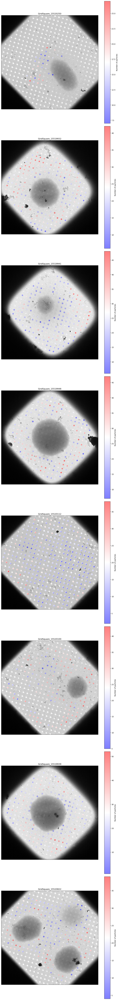

In [49]:
fig, axs = plt.subplots(nrows=len(gridsquares), figsize=(10,10*len(gridsquares)))

for n, gridsquare in enumerate(gridsquares):
    tree = ET.parse(EPUdir+'/Metadata/GridSquare_'+gridsquare+'.dm')
    root = tree.getroot()

    coordslist=[]
    ParN = []
    for k in hole_dict.keys():
        foilID=k.split("_")[1]
        coords=get_hole_coords(foilID, root)
        if coords != None:
            ParN.append(float(hole_dict[k]))
            X,Y=coords
            coordslist.append((X,Y))
    Xcoords,Ycoords=np.array(coordslist).T



    gridimage=find('GridSquare_*.jpg', EPUdir+'/Images-Disc1/GridSquare_'+gridsquare+'/')[-1] #minus one finds the latest gridsqure image, in case there are two
    img = mpimg.imread(gridimage)
    smallW, smallH = PIL.Image.open(gridimage).size
    ax = axs[n]
    ax.imshow(np.rot90(img),cmap="gray")
    # earlier version:
    # plt.scatter(biny*Ycoords/micH*smallH,(micW-binx*Xcoords)/micW*smallW,c=ParN,cmap='bwr',s=50,alpha=0.5)
    # I think therefore SOMETIMES you need to multiply by binning? In this example, everything was off by 2, so I deleted the binning factor and it looked correct.
    # Again might be camera dependent?
    scatter = ax.scatter(Ycoords/micH*smallH,(micW-Xcoords)/micW*smallW,c=ParN,cmap='bwr',s=50,alpha=0.5)
    cbar = fig.colorbar(scatter)
    cbar.set_label('Number of particles')
    ax.set_title(f'GridSquare_{gridsquare}')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()



## Can also parse atlas

In [52]:
atlasmrc = mrcfile.read("Atlas/Sample7/Atlas/Atlas_1.mrc")

In [53]:
tree=ET.parse('Atlas/Sample7/Atlas/Atlas.dm')
root=tree.getroot()

In [54]:
# This might be the more normal way the XMLs with namespaces are parsed...

ns = {'atlas' : "{http://schemas.datacontract.org/2004/07/Applications.SciencesAppsShared.GridAtlas.Persistence}",
      'i' : '{http://www.w3.org/2001/XMLSchema-instance}',
      'z' : '{http://schemas.microsoft.com/2003/10/Serialization/}',
      'tp' : '{http://schemas.datacontract.org/2004/07/Fei.Applications.Common.Types}',
      'so' : '{http://schemas.datacontract.org/2004/07/Fei.SharedObjects}',
      'ar': '{http://schemas.microsoft.com/2003/10/Serialization/Arrays}',
      'dr': '{http://schemas.datacontract.org/2004/07/System.Drawing}',
      'per': '{http://schemas.datacontract.org/2004/07/Applications.Epu.Persistence}',
     'dm': '{http://schemas.datacontract.org/2004/07/Applications.SciencesAppsShared.GridAtlas.Datamodel}'}

xcoords=[]
ycoords=[]
rots=[]
shears=[]
heights=[]
widths=[]
squareids=[]


for square in root.findall(".//{atlas}PositionOnTheAtlas/..".format(**ns)):
    x = float(square.find("./{atlas}PositionOnTheAtlas/{dm}Center/{dr}x".format(**ns)).text)
    y = float(square.find("./{atlas}PositionOnTheAtlas/{dm}Center/{dr}y".format(**ns)).text)
    rotation = float(square.find("./{atlas}PositionOnTheAtlas/{dm}Rotation".format(**ns)).text)
    shear = float(square.find("./{atlas}PositionOnTheAtlas/{dm}Shear".format(**ns)).text)
    height = float(square.find("./{atlas}PositionOnTheAtlas/{dm}Size/{dr}height".format(**ns)).text)
    width = float(square.find("./{atlas}PositionOnTheAtlas/{dm}Size/{dr}width".format(**ns)).text)
    squareID=square.find("./{tp}Id".format(**ns)).text
    
    xcoords.append(x)
    ycoords.append(y)
    rots.append(rotation)
    shears.append(shear)
    heights.append(height)
    widths.append(width)
    squareids.append(squareID)

In [ ]:
# figuring out which squares are which, here are some known labels

# a square with no particles:
noparsquare = squareids[0]

# square with particles:
parsquare = '17449650'

# a square skipped during acquisition
skippedsquare = '17450055'

In [61]:
EPUdir = 'EPUsession'
tree = ET.parse(EPUdir+'/Metadata/GridSquare_'+skippedsquare+'.dm')
root = tree.getroot()

In [62]:
len(root.findall("./{per}ParticleAcquisitions//{tp}BaseFileName".format(**ns)))

0

In [235]:
root.find("./{per}Order".format(**ns)).text

'-1'

507


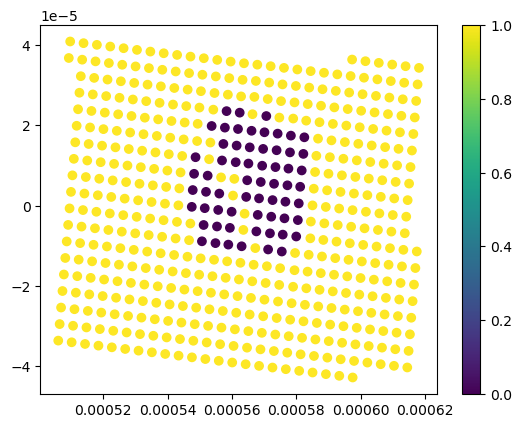

In [63]:
xs=np.array([float(x.text) for x in root.findall(".//{per}StagePosition/{so}X".format(**ns))])
ys=np.array([float(x.text) for x in root.findall(".//{per}StagePosition/{so}Y".format(**ns))])
states=np.array([x.text for x in root.findall(".//{per}TargetLocations//{per}State".format(**ns))])
print(len(xs))
plt.scatter(xs,ys,c=(states=='Defined'))
plt.colorbar()

In [64]:
acquisitions=[]
skipped=[]
holesset=[]
holesacquired=[]
order=[]
for square in squareids:
    tree = ET.parse(EPUdir+'/Metadata/GridSquare_'+square+'.dm')
    root = tree.getroot()
    acquisitions.append(len(root.findall(".//{per}ParticleAcquisitions//{tp}BaseFileName".format(**ns))))
    
    states=np.array([x.text for x in root.findall(".//{per}TargetLocations//{per}State".format(**ns))])
    holesset.append( np.sum(states != 'Defined') )
    skipped.append( np.sum(states == 'Skipped') )
    holesacquired.append( np.sum(states == 'Completed') )
    order.append( int(root.find("./{per}Order".format(**ns)).text) )

    

KeyboardInterrupt: 

In [245]:
numberParticles=[]
for gridsquare in squareids:
    tree = ET.parse(EPUdir+'/Metadata/GridSquare_'+gridsquare+'.dm')
    root = tree.getroot()
    ParN = 0
    for k in hole_dict.keys():
        foilID=k.split("_")[1]
        coords=get_hole_coords(foilID, root)
        if coords != None:
            ParN+=float(hole_dict[k])
    numberParticles.append(ParN)

In [247]:
d = {'xcoord' : xcoords, 'ycoord' : ycoords, 'rotation' : rots, 'shear' : shears, 'height' : heights, 'width' : widths, 'ID' : squareids, 'Acquired': acquisitions,
    'HolesSkipped' : skipped, 'HolesSet' : holesset, 'HolesAcquired' : holesacquired, 'OrderProcessed' : order, 'NumberParticles' : numberParticles}
df = pd.DataFrame(data=d)

In [262]:
df['SquareQuality'] = df['NumberParticles'] / df['Acquired']

In [263]:
df[df['HolesSet']>1]

,xcoord,ycoord,rotation,shear,height,width,ID,Acquired,HolesSkipped,HolesSet,HolesAcquired,OrderProcessed,NumberParticles,SquareQuality
110,954.369568,2128.381350,0.303460,-0.002907,103.256645,102.644058,17449300,395,20,64,44,19,3521.0,8.913924
114,899.545166,2304.347410,0.294235,-0.009225,103.873383,109.268791,17449325,63,0,8,7,30,412.0,6.539683
188,3288.033690,1805.010130,0.300606,-0.005761,104.123817,106.124832,17449634,594,0,67,66,13,9791.0,16.483165
189,3461.722410,1857.716430,0.300606,-0.005761,101.951462,104.385078,17449636,603,0,67,67,14,11577.0,19.199005
191,3232.592770,1976.382450,0.300606,-0.005761,100.342934,102.729782,17449640,432,0,48,48,12,6154.0,14.245370
192,3407.630000,2029.446000,0.300606,-0.005761,102.863533,102.898689,17449643,513,0,58,57,11,9135.0,17.807018
193,3579.964840,2082.540000,0.300606,-0.005761,102.233383,104.553986,17449645,585,0,65,65,10,10319.0,17.639316
195,3352.747000,2201.798580,0.300606,-0.005761,104.173569,103.422300,17449650,675,0,76,75,8,13055.0,19.340741
196,3524.442140,2254.451170,0.300606,-0.005761,101.022827,102.206177,17449652,540,0,60,60,9,8676.0,16.066667
218,2732.639400,656.554932,0.312632,-0.012176,102.762680,103.814774,17449765,522,0,58,58,16,11945.0,22.883142


In [261]:
np.sum(df['Acquired'][df['SquareQuality'] > 200])

1818

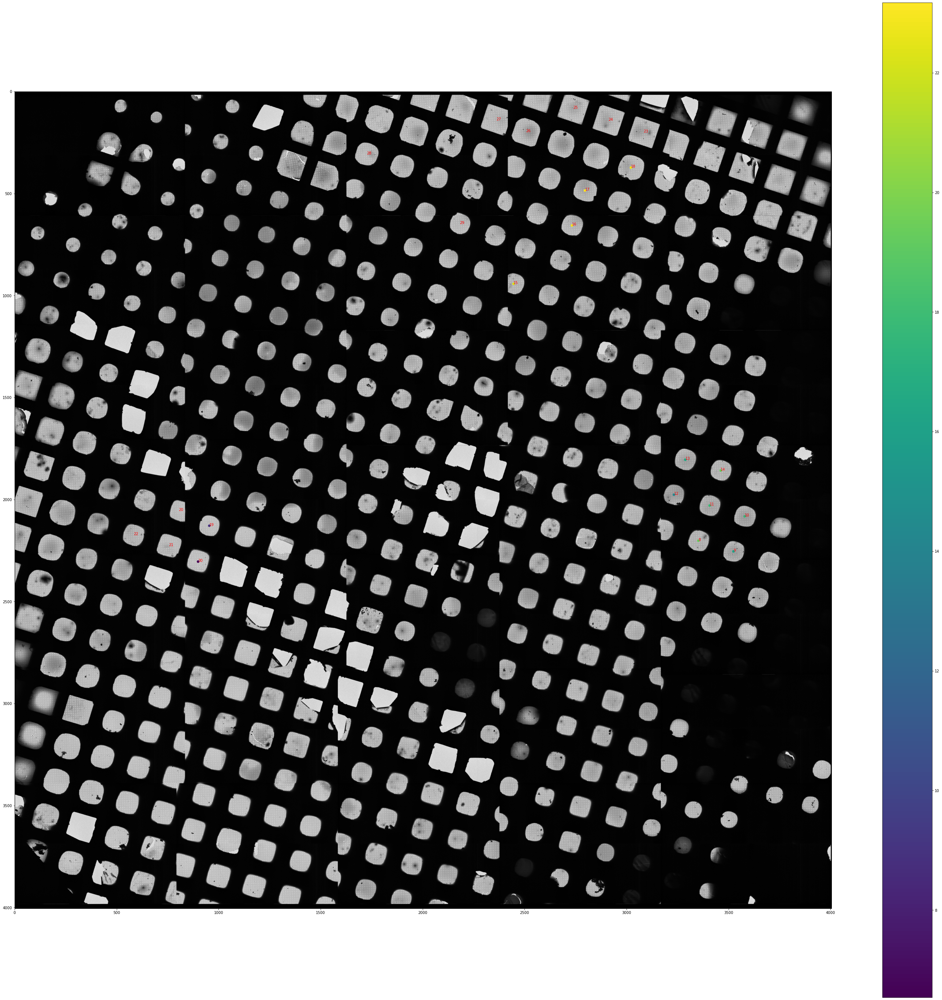

In [295]:
plt.figure(figsize=[50,50])
plt.imshow(atlasmrc, cmap="gray")
plt.scatter(df['xcoord'], df['ycoord'], c=df['SquareQuality'])
for i, label in enumerate(df['HolesSet']):
    if label > 1:
        plt.annotate(df['OrderProcessed'][i], (df['xcoord'][i], df['ycoord'][i]),c='r')
plt.colorbar()
plt.savefig("FIGURE.pdf")

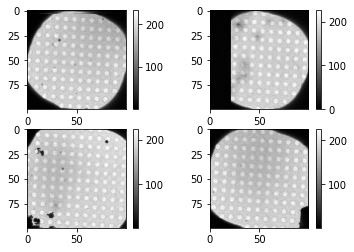

In [291]:
xs = df['xcoord'][df['SquareQuality'] > 20]
ys = df['ycoord'][df['SquareQuality'] > 20]

xs=np.array(xs)
ys=np.array(ys)

for i, x in enumerate(xs):
    x = xs[i]
    y = ys[i]
    plt.subplot(2,2,i+1)
    #x = 2796.540770
    #y = 485.098083
    window=50
    x=int(x)
    y=int(y)

    plt.imshow(atlasmrc[y-window:y+window,x-window:x+window],cmap="gray")
    plt.colorbar()

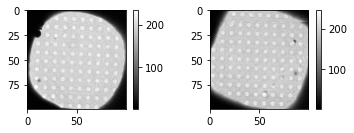

In [292]:
xs = df['xcoord'][df['SquareQuality'] < 10]
ys = df['ycoord'][df['SquareQuality'] < 10]

xs=np.array(xs)
ys=np.array(ys)

for i, x in enumerate(xs):
    x = xs[i]
    y = ys[i]
    plt.subplot(2,2,i+1)
    #x = 2796.540770
    #y = 485.098083
    window=50
    x=int(x)
    y=int(y)

    plt.imshow(atlasmrc[y-window:y+window,x-window:x+window],cmap="gray")
    plt.colorbar()